## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

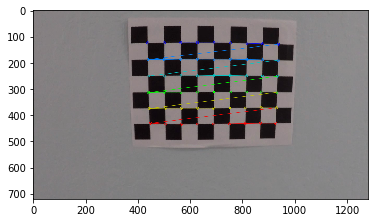

In [1]:
import numpy as np
import cv2
import glob
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
import math
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx,fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imwrite('../output_images/corners_found'+str(idx+1)+'.jpg', img)
        plt.imshow(img)
        #cv2.waitKey(500)

#cv2.destroyAllWindows()

## And so on and so forth...

In [2]:
img = cv2.imread('../camera_cal/calibration1.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
# Read in the saved objpoints and imgpoints
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump(dist_pickle, open('../calibration_pickle.p', 'wb'))

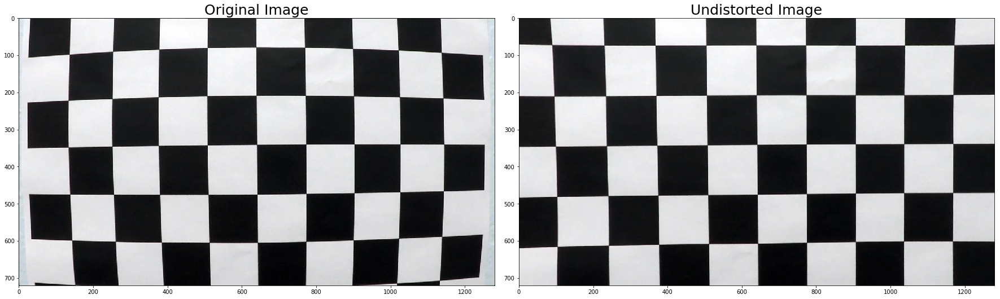

In [3]:
def cal_undistort(img, objpoints, imgpoints):
    # Use cv2.calibrateCamera() and cv2.undistort()
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst

undistorted = cal_undistort(img, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=25)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

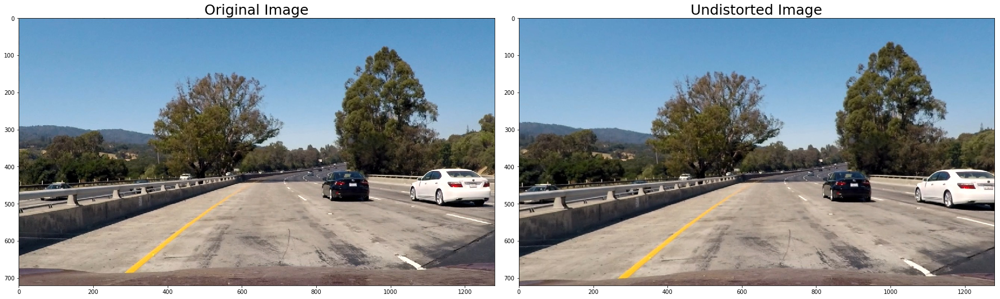

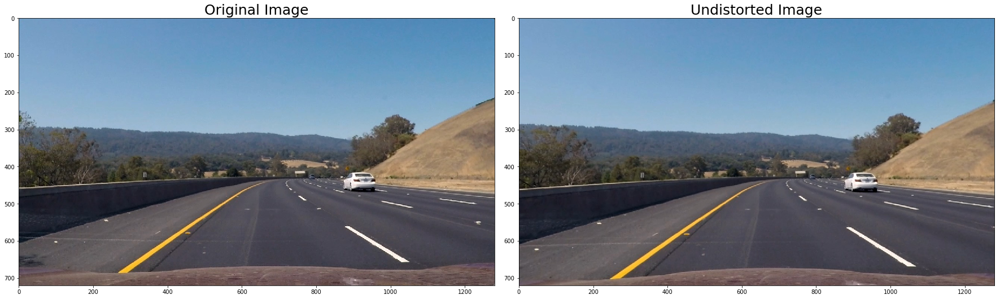

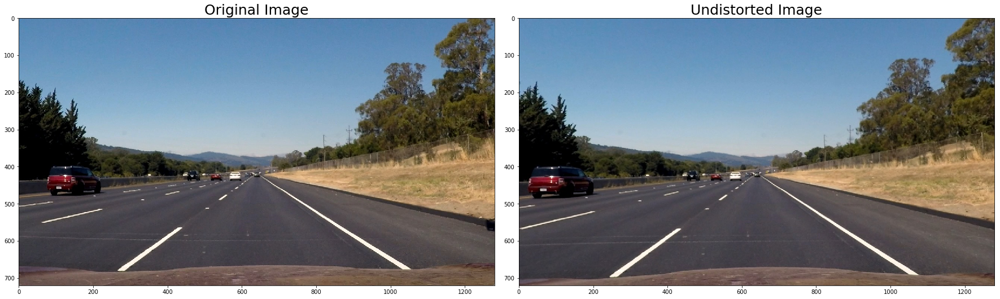

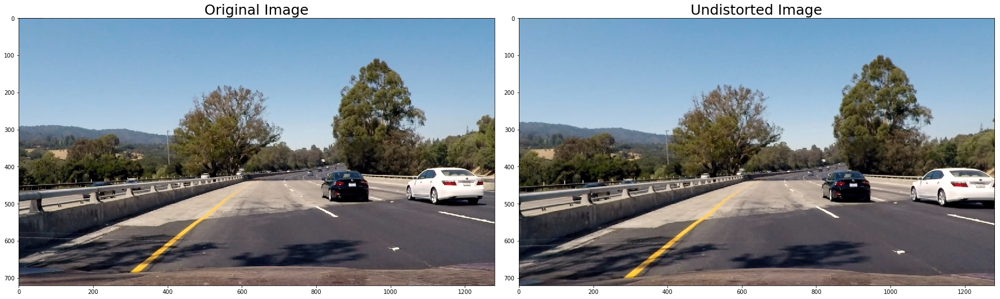

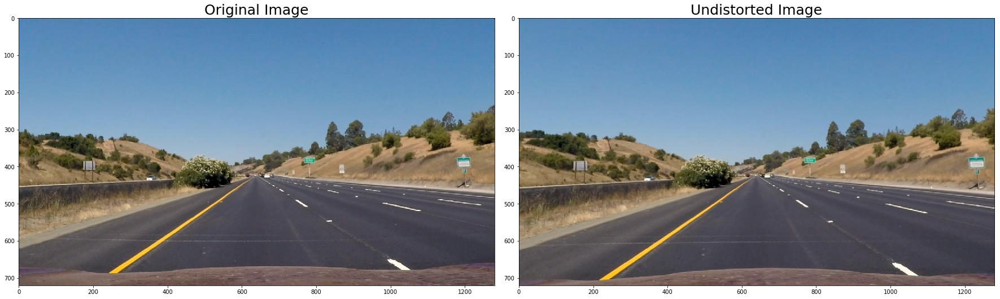

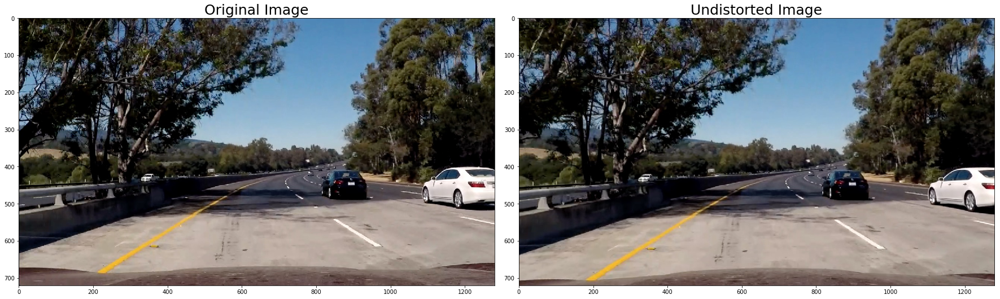

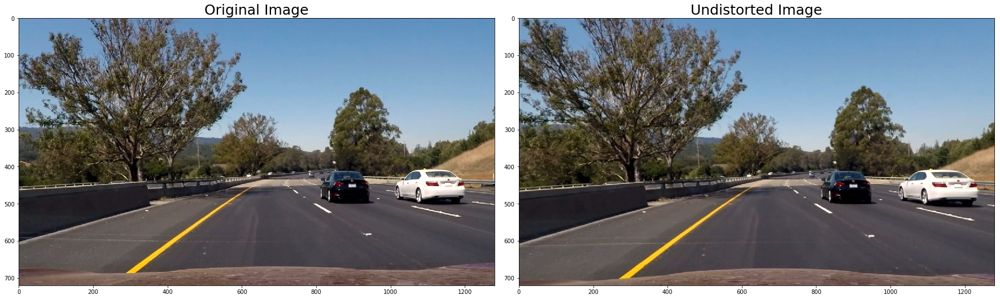

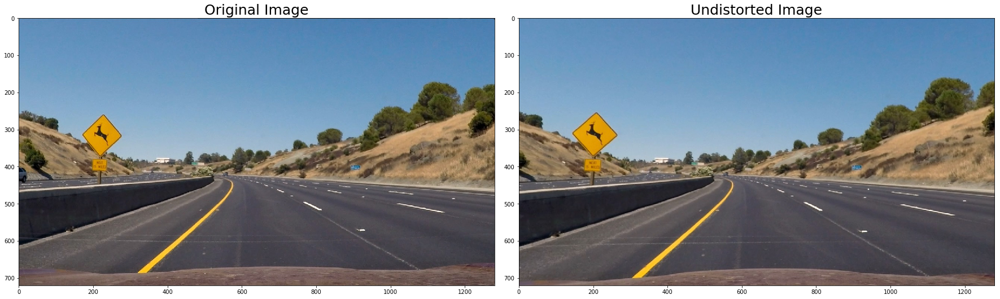

In [4]:
images = glob.glob('../test_images/*.jpg')

for idx, file in enumerate(images):
    img = cv2.imread(file)
     
    undistorted = cal_undistort(img, objpoints, imgpoints)
    
    cv2.imwrite("../output_images/undistorted_"+str(idx)+ '.jpg', undistorted)
    
    r, g, b = cv2.split(img)
    img= cv2.merge((b, g, r))
    
    r, g, b = cv2.split(undistorted)
    undistorted= cv2.merge((b, g, r))
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=25)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=25)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

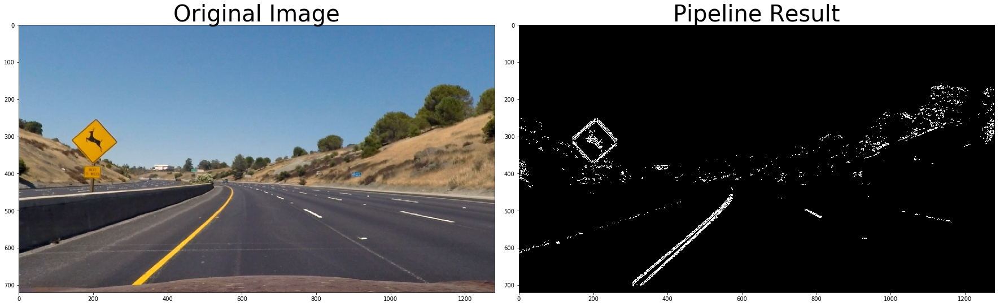

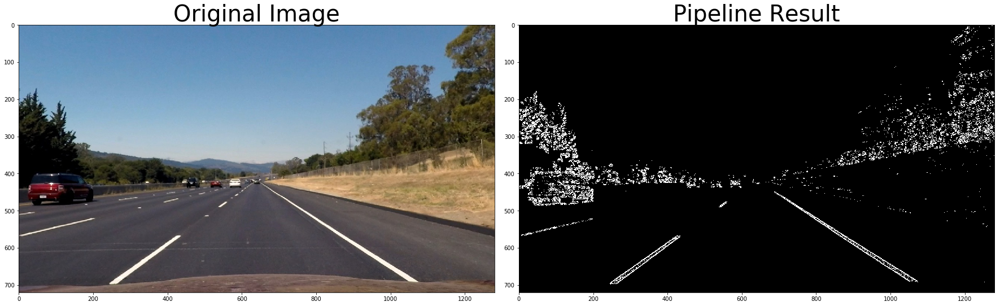

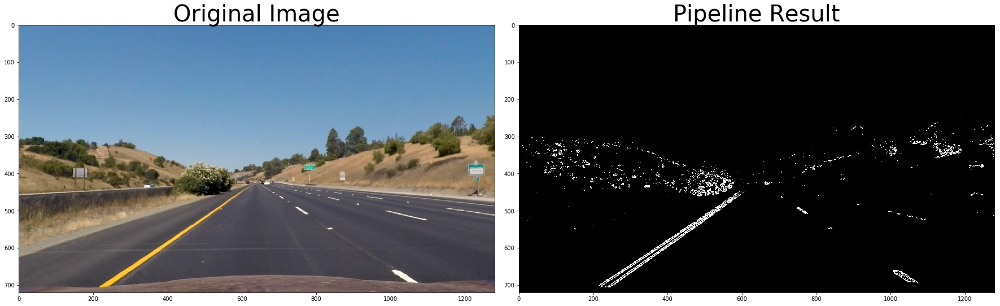

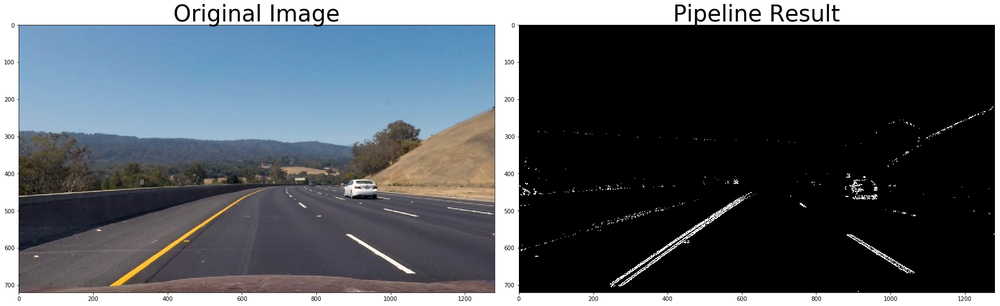

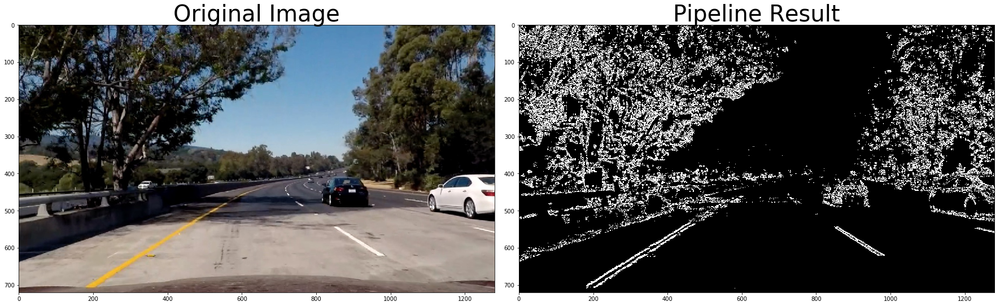

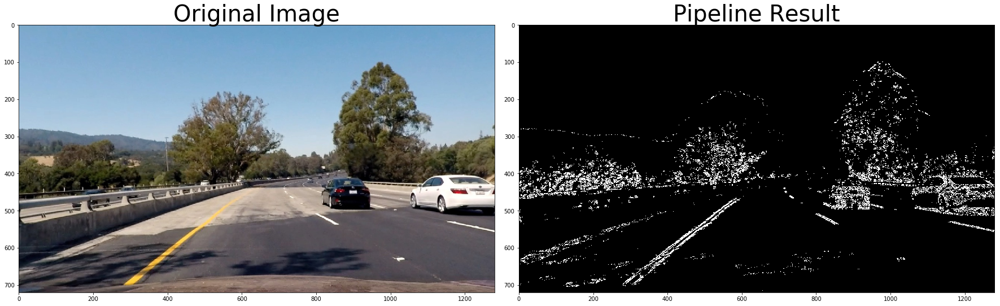

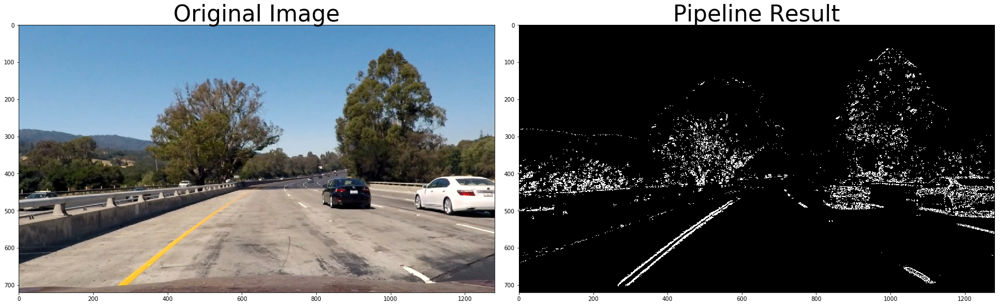

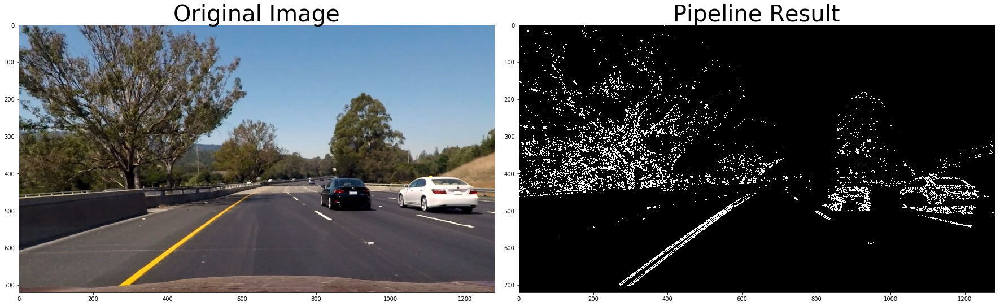

In [5]:
def pipeline(img, h_thresh=(150, 255), l_thresh=(20, 255),s_thresh=(100, 255), sx_thresh=(12, 255), sy_thresh=(25, 255)):
    img = np.copy(img)
    # Convert to HLS color space and separate the S channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    h_channel = hls[:,:,0]
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Sobel x
    sobelx = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx)
    scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Sobel y
    sobely = cv2.Sobel(s_channel, cv2.CV_64F, 0, 1) # Take the derivative in y
    abs_sobely = np.absolute(sobely) 
    scaled_sobely = np.uint8(255*abs_sobely/np.max(abs_sobely))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobelx)
    sxbinary[(scaled_sobelx >= sx_thresh[0]) & (scaled_sobelx <= sx_thresh[1])] = 1
    
    # Threshold y gradient
    sybinary = np.zeros_like(scaled_sobely)
    sybinary[(scaled_sobely >= sy_thresh[0]) & (scaled_sobely <= sy_thresh[1])] = 1
    
    # Threshold color channel
    h_binary = np.zeros_like(h_channel)
    h_binary[(h_channel >= h_thresh[0]) & (h_channel <= h_thresh[1])] = 1
    
    # Threshold color channel
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, sybinary, h_binary, l_binary, s_binary)) * 255
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[((h_binary == 1) & (s_binary == 1) & (l_binary == 1)) | ((sxbinary == 1) & (sybinary == 1))] = 1
    return combined_binary
    
images = glob.glob('../output_images/undistorted_*.jpg')

for idx, file in enumerate(images):
    img = cv2.imread(file)
    
    result = pipeline(img)
    
    cv2.imwrite("../output_images/binary_"+str(idx)+ '.jpg', result)
    
    r, g, b = cv2.split(img)
    img= cv2.merge((b, g, r))
    
    #r, g, b = cv2.split(result)
    #result= cv2.merge((b, g, r))
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result, cmap = 'gray')
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

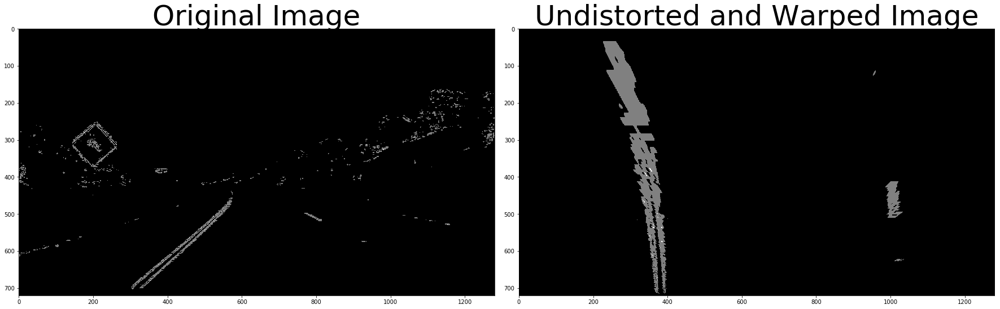

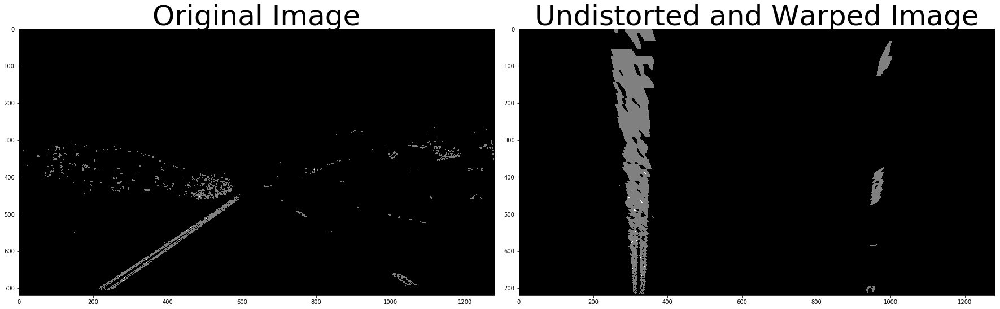

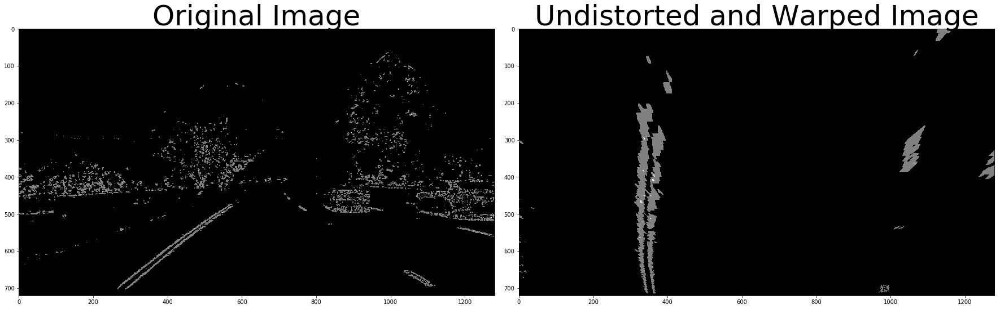

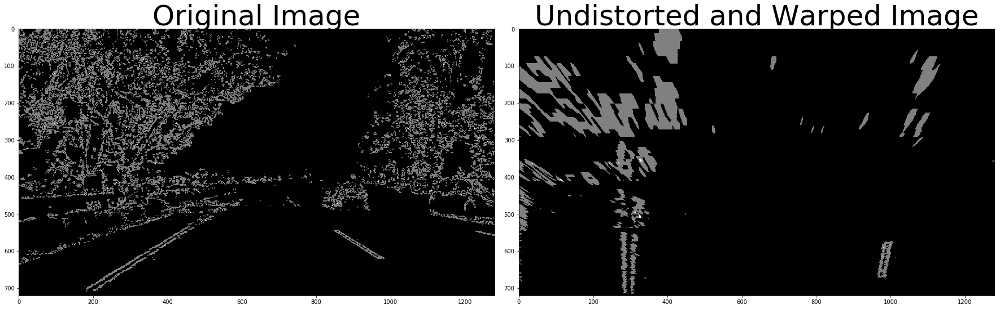

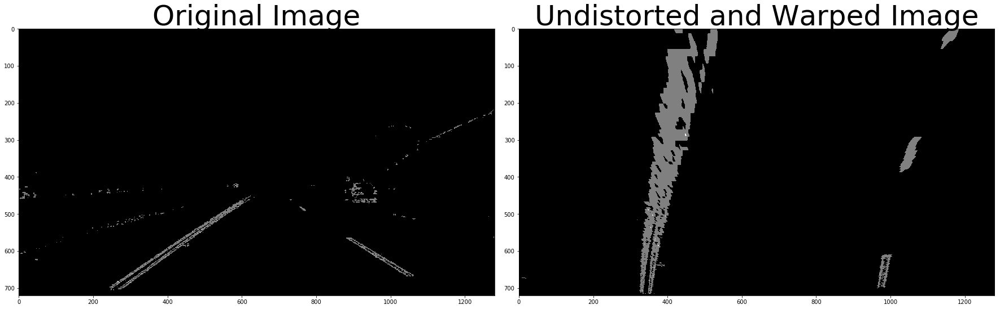

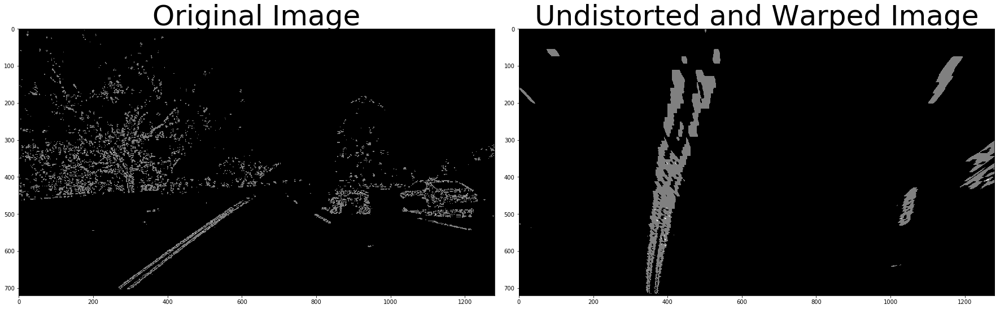

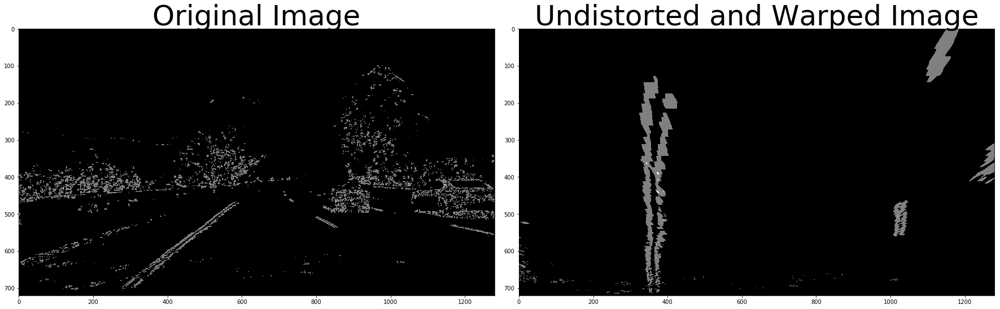

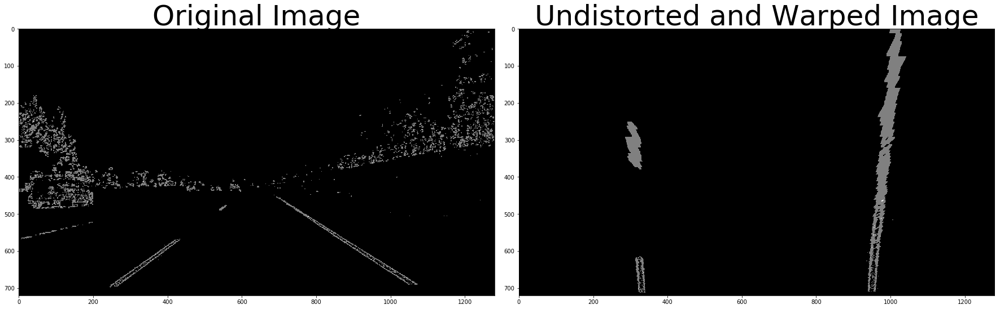

In [6]:
%matplotlib inline
def warp(img):
    
    # Grab the image shape
    img_size = (img.shape[1], img.shape[0])
    
    # For source points I'm grabbing the outer four detected corners         
    src = np.float32(
        [[585, 460], 
         [695, 460], 
         [1127, 720], 
         [203, 720]])
                 
    offset = img_size[0] * 0.25
                     
    dst = np.float32(
        [[offset, 0], 
         [img_size[0]-offset, 0], 
         [img_size[0]-offset, img_size[1]], 
         [offset, img_size[1]]])
    
    '''dst = np.float32(
        [[270, 0], 
         [1037, 0], 
         [1037, 720], 
         [270, 720]])'''
    
    # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # e) use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped, M, Minv

files = glob.glob('../output_images/binary*.jpg')

for idx, file in enumerate(files):
    img = mpimg.imread(file)
    
    warped_im, M, Minv = warp(img)
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(img, cmap='gray')
    ax1.set_title('Original Image', fontsize=50)

    ax2.imshow(warped_im, cmap='gray')
    ax2.set_title('Undistorted and Warped Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    cv2.imwrite("../output_images/undistorted_and_warped_"+str(idx)+'.jpg', warped_im)

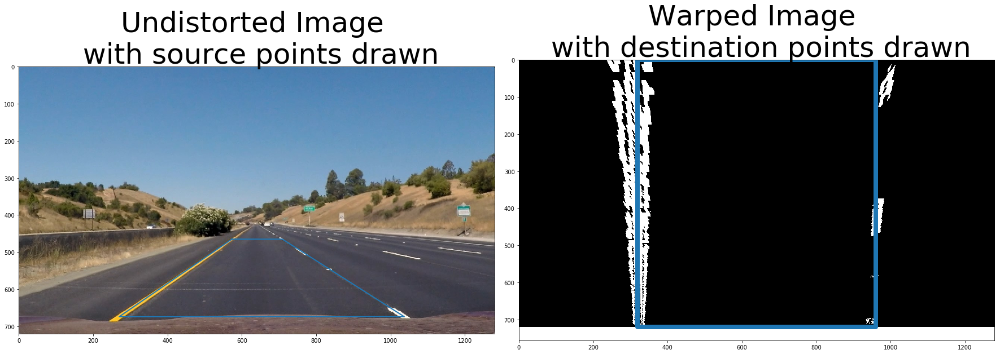

In [7]:
# Read in the image
image = mpimg.imread('../test_images/straight_lines1.jpg')

undistorted = cal_undistort(image, objpoints, imgpoints)
undistorted = pipeline(undistorted)
warped_image, M, Minv = warp(undistorted)

image_size = (image.shape[1], image.shape[0])                 
offset = image_size[0] * 0.25

# Define the vertices of a trapezoidal mask.
top_left = [573, 465]
top_right = [709, 465]
bottom_right = [1037, 674]
bottom_left = [270, 674]
    
top_left2 = [320, 0]
top_right2 = [960, 0]
bottom_right2 = [960, image_size[1]]
bottom_left2 = [320, image_size[1]]

x = [top_left[0], top_right[0], bottom_right[0], bottom_left[0], top_left[0]]
y = [top_left[1], top_right[1], bottom_right[1], bottom_left[1], top_left[1]]

x2 = [top_left2[0], top_right2[0], bottom_right2[0], bottom_left2[0], top_left2[0]]
y2 = [top_left2[1], top_right2[1], bottom_right2[1], bottom_left2[1], top_left2[1]]

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.plot(x,y, lw=2)
ax1.set_title('Undistorted Image \n with source points drawn', fontsize=50)

ax2.imshow(warped_image, cmap = 'gray')
ax2.plot(x2,y2, lw=8)
ax2.set_title('Warped Image \n with destination points drawn', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

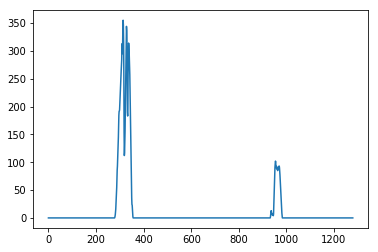

In [8]:
def hist(img):
    bottom_half = img[img.shape[0]//2:,:]


    histogram = np.sum(bottom_half, axis=0)
    
    return histogram

# Create histogram of image binary activations
histogram = hist(warped_image)

# Visualize the resulting histogram
plt.plot(histogram)

In [9]:
#pixels between the left and right lanes
histogram = np.sum(warped_image[warped_image.shape[0]//2:,:], axis=0)
midpoint = np.int(histogram.shape[0]//2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint
print(rightx_base - leftx_base)

640


In [10]:
def find_lane_pixels(binary_warped):
    
    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    
   
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    
    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero (i.e. activated) pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
     # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(255,0,0), 2)
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(255,0,0), 2)
        
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass
   
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    

    return leftx, lefty, rightx, righty, out_img, nonzerox, nonzeroy, left_lane_inds, right_lane_inds

def fit_polynomial(binary_warped):
    global left_x_arr, right_x_arr, laneIdxCount
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img, nonzerox, nonzeroy, left_lane_inds, right_lane_inds = find_lane_pixels(binary_warped)
    
    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return out_img, left_fit_cr, right_fit_cr, left_fit, right_fit

In [11]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def weighted_img(img, initial_img, α=0.8, β=1., γ=0.):
    """
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, γ)

In [12]:
def measure_curvature_real(left_fit_cr, right_fit_cr):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad

In [13]:
def offset(binary_warped):
    left_fitx, right_fitx, ploty, out_img = fit_polynomial(binary_warped)
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    camera_center = (left_fitx[-1] + right_fitx[-1])/2
    center_diff = (camera_center - binary_warped.shape[1]/2) * xm_per_pix
    side_pos = 'left'
    if center_diff <= 0:
        side_pos = 'right'
    
    return center_diff, side_pos

In [14]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
ploty = np.linspace(0, 719, num=720)
M_MInverse_Matrix = pickle.load( open('../calibration_pickle.p', 'rb' ) )
M_, MInverse = map(M_MInverse_Matrix.get, ('M','MInverse'))
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension
count = 0.0
lane_count = 0
pts_left_arr, pts_right_arr = [], []


def process_image(img):
    global lane_count
    global count
    
    
    
    # 1. Undistortion
    img = cv2.undistort(img, mtx, dist, None, mtx)
    
    # 2. Apply Perspective Transform
    img_raw = img.copy()
    # img_raw = cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB)
    bottomY = 720
    topY = 450

    left1_x, left1_y = (150, bottomY)
    left2_x, left2_y = (590, topY)
    right1_x, right1_y = (710, topY)
    right2_x, right2_y = (1250, bottomY)

    cv2.line(img_raw, (left1_x, left1_y), (left2_x, left2_y), [255, 0, 0], 2)
    cv2.line(img_raw, (left2_x, left2_y), (right1_x, right1_y), [255, 0, 0], 2)
    cv2.line(img_raw, (right1_x, right1_y), (right2_x, right2_y), [255, 0, 0], 2)
    cv2.line(img_raw, (right2_x, right2_y), (left1_x, left1_y), [255, 0, 0], 2)
    gray = cv2.cvtColor(img_raw, cv2.COLOR_RGB2GRAY)
    src = np.float32([[left2_x, left2_y], [right1_x, right1_y], [right2_x, right2_y], [left1_x, left1_y]])
    nX = gray.shape[1]
    nY = gray.shape[0]
    img_size = (nX, nY)
    offset = 200
    dst = np.float32([[offset, 0], [img_size[0]-offset, 0], [img_size[0]-offset, img_size[1]], [offset, img_size[1]]])
    img_size = (img.shape[1], img.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    MInverse = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, img_size)
    
    
    # 3. Combine Color and Gradient Threshold
    hls = cv2.cvtColor(warped, cv2.COLOR_BGR2HLS)
    yuv = cv2.cvtColor(warped, cv2.COLOR_BGR2YUV)
    lab = cv2.cvtColor(warped, cv2.COLOR_BGR2LAB)
    gray = cv2.cvtColor(warped, cv2.COLOR_RGB2GRAY)
    
    s_channel = hls[:,:,2]
    s_thresh = (100, 255)
    l_channel = hls[:,:,1]
    l_thresh = (100, 255)
    y_channel = yuv[:,:,0]
    y_thresh = (100, 255)
    
    sx_thresh=(10, 160) 
    
    # Sobel x
    sobelx = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobelx)
    sxbinary[(scaled_sobelx >= sx_thresh[0]) & (scaled_sobelx <= sx_thresh[1])] = 1
    
    # Threshold S channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    # Threshold L channel
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    
    # Threshold Y channel
    y_binary = np.zeros_like(y_channel)
    y_binary[(y_channel >= y_thresh[0]) & (y_channel <= y_thresh[1])] = 1
    
    
    # Stack each channel
    color_binary = np.zeros_like(s_channel)*255
    color_binary[(sxbinary == 1) | (((s_channel == 1) & (l_channel==1)) & (y_channel==1)) ] = 1
  

    
    # 4. Fit lane lines to polynomial
    out_img, left_fit_cr, right_fit_cr, left_fit, right_fit = fit_polynomial(color_binary)
    left_curverad, right_curverad = measure_curvature_real(left_fit_cr, right_fit_cr)
    
    # 5. Merge final lane lines to original image 
    color_warp = np.zeros_like(img).astype(np.uint8)
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    
    Sanity Check 
    pts_left_arr.append(pts_left)
    pts_right_arr.append(pts_right)
    lane_count += 1
    
    if np.all(pts_right.squeeze(0)[:,0] > pts_left.squeeze(0)[:,0]):

        pts = np.hstack((pts_left, pts_right))
        if len(pts_left_arr) > 3:
            pts_left_smooth = (pts_left_arr[lane_count - 1] + pts_left_arr[lane_count - 2] + pts_left_arr[lane_count - 3]) / 3
            pts_right_smooth = (pts_right_arr[lane_count - 1] + pts_right_arr[lane_count - 2] + pts_right_arr[lane_count - 3]) / 3
            pts = np.hstack((pts_left_smooth, pts_right_smooth))
    else:
        pts_left_temp = pts_left_arr[lane_count - 2]
        pts_right_temp = pts_right_arr[lane_count - 2]
        pts_left_arr.append(pts_left_temp)
        pts_right_arr.append(pts_right_temp)
        pts = np.hstack((pts_left_temp, pts_right_temp))
        lane_count += 1
    
    
        
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, MInverse, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    count +=1.0
    avg_curverad = (left_curverad + right_curverad)/2
    cv2.putText(result, 'Radius of Curvature =' + str(round(avg_curverad, 3)) + '(m)', (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    
    # Calculate vehicle center and deviation from center 
    # Calculate vehicle center
    xMax = img.shape[1]*xm_per_pix
    yMax = img.shape[0]*ym_per_pix
    vehicleCenter = xMax / 2
    leftLane = left_fit_cr[0]*yMax**2 + left_fit_cr[1]*yMax + left_fit_cr[2]
    rightLane = right_fit_cr[0]*yMax**2 + right_fit_cr[1]*yMax + right_fit_cr[2]
    middleLane = leftLane + (rightLane - leftLane)/2
    diffFromVehicle = middleLane - vehicleCenter
    
    if diffFromVehicle > 0:
        message = '{:.2f} m right'.format(diffFromVehicle)
    else:
        message = '{:.2f} m left'.format(-diffFromVehicle)
        
    cv2.putText(result, 'Vehicle is {} of center'.format(message), (50, 190), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    
    return result

[MoviePy] >>>> Building video ../project_video_output.mp4
[MoviePy] Writing video ../project_video_output.mp4


100%|█████████▉| 1260/1261 [04:42<00:00,  4.42it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../project_video_output.mp4 

CPU times: user 2min 28s, sys: 4.08 s, total: 2min 32s
Wall time: 4min 45s


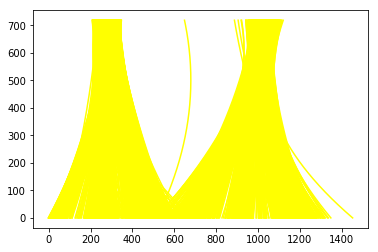

In [15]:
project_video_output = '../project_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
clip1 = VideoFileClip("../project_video.mp4")
#clip1 = VideoFileClip("project_video.mp4")
project_video_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time project_video_clip.write_videofile(project_video_output, audio=False)

In [16]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_video_output))

[MoviePy] >>>> Building video ../challenge_video_output.mp4
[MoviePy] Writing video ../challenge_video_output.mp4


100%|██████████| 90/90 [00:18<00:00,  3.87it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../challenge_video_output.mp4 

CPU times: user 10.9 s, sys: 704 ms, total: 11.6 s
Wall time: 21.6 s


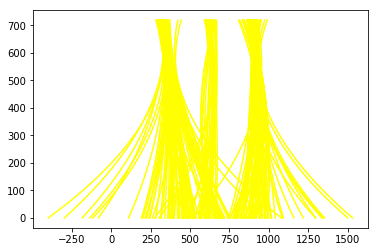

In [17]:
#project_video_output = '../test_videos_output/solidWhiteRight.mp4'
try:
    challenge_video_output = '../challenge_video_output.mp4'
    ## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
    ## To do so add .subclip(start_second,end_second) to the end of the line below
    ## Where start_second and end_second are integer values representing the start and end of the subclip
    ## You may also uncomment the following line for a subclip of the first 5 seconds
    clip1 = VideoFileClip("../challenge_video.mp4").subclip(3,6)
    #clip1 = VideoFileClip("challenge_video.mp4")
    project_video_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
    %time project_video_clip.write_videofile(challenge_video_output, audio=False)
except:
    pass

In [18]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_video_output))

[MoviePy] >>>> Building video ../harder_challenge_video_output.mp4
[MoviePy] Writing video ../harder_challenge_video_output.mp4


100%|█████████▉| 575/576 [02:23<00:00,  4.51it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../harder_challenge_video_output.mp4 

CPU times: user 1min 6s, sys: 3.77 s, total: 1min 10s
Wall time: 2min 27s


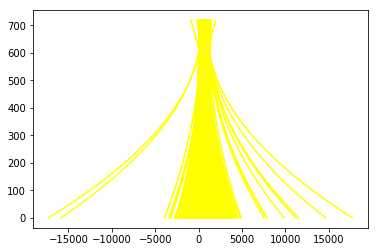

In [19]:
#project_video_output = '../test_videos_output/solidWhiteRight.mp4'
harder_challenge_video_output = '../harder_challenge_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
clip1 = VideoFileClip("../harder_challenge_video.mp4").subclip(0,23)
#clip1 = VideoFileClip("harder_challenge_video.mp4")
project_video_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time project_video_clip.write_videofile(harder_challenge_video_output, audio=False)

In [20]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(harder_challenge_video_output))